In [2]:
%load_ext autoreload
%autoreload 2

In [4]:
import os

os.chdir(
    "/hpc/mydata/saugat.kandel/sam2_projects/segment-anything-2/notebooks/cryosam_results_analysis"
)

import sys

sys.path.append("../")
import my_sam2_utils as utils

In [5]:
import numpy as np
import matplotlib.pyplot as plt
import zarr
import copick
import sys
from tqdm.notebook import tqdm
import scipy
import patchworklib as pw

<Figure size 100x100 with 0 Axes>

In [6]:
copick_config = (
    "/hpc/projects/group.czii/krios1.processing/copick/24jul29c/run002/copick_config.json"
)
name = "lysosome"

# Open Copick Project and Query All Available Runs
root = copick.from_file(copick_config)
run_ids = [run.name for run in root.runs]

In [7]:
membrane_threshold = 50000

In [8]:
memb_runs = []
for run in tqdm(root.runs):
    membrane = utils.get_membrane(run, verbose=False)
    if membrane.sum() < membrane_threshold:
        continue
    memb_runs.append(run)

  0%|          | 0/266 [00:00<?, ?it/s]

### This is for cryosam2_0 results

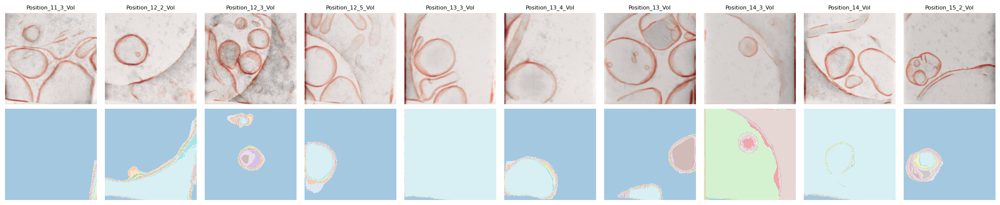

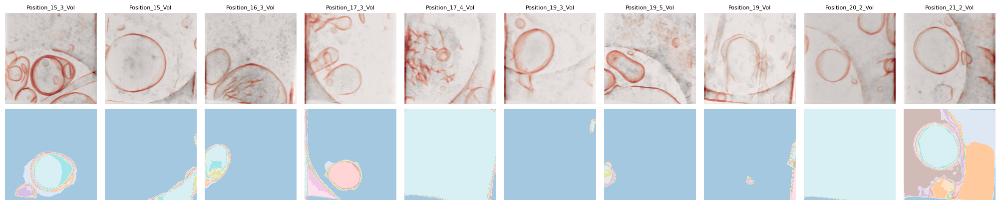

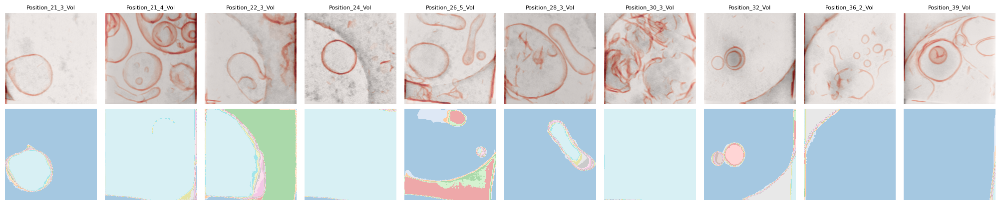

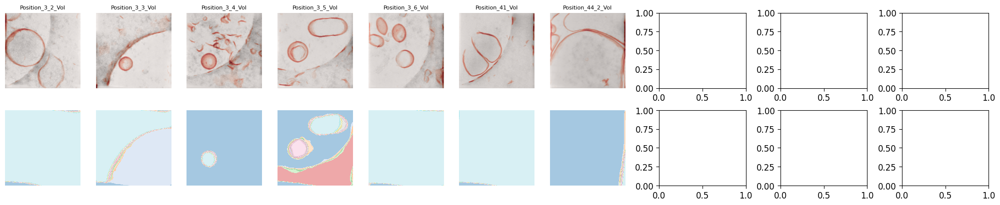

In [14]:
cryosam_idx = 3

pw_rows = []
pw_new_col = []
fig = None
fig_col_count = 0
verbose = False

organelle_segs_all = []
no_organelles_all = []
no_cryosam = []
for run in memb_runs:
    organelle_segs = run.get_segmentations("cryoSAM2", session_id=str(cryosam_idx))
    if len(organelle_segs) == 0:
        if verbose:
            print(f"Skipping {run.name} as it has no cyoSAM outputs")
        no_cryosam.append(run)
        continue
    elif organelle_segs[0].numpy().max() == 0:
        if verbose:
            print(f"Skipping {run.name} as it has no organelle segmentation")
        no_organelles_all.append(run)
        continue
    tomo = utils.get_tomogram(run, verbose=False)
    membrane = utils.get_membrane(run, verbose=False)

    if fig is None:
        fig, axs = plt.subplots(2, 10, figsize=(20, 4), constrained_layout=True)
        axs = axs.ravel()
    axs[fig_col_count].imshow(tomo.sum(axis=0), cmap="gray")
    axs[fig_col_count].imshow(membrane.sum(axis=0), cmap="Reds", alpha=0.5)
    axs[fig_col_count].set_title(run.name, fontsize=8)
    axs[fig_col_count].axis("off")

    if len(organelle_segs) == 0:
        axs[fig_col_count + 10].set_title("No_org_seg", fontsize=8)
    else:
        cm = axs[fig_col_count + 10].imshow(
            organelle_segs[0].numpy().sum(axis=0), cmap="tab20", alpha=0.4
        )
        axs[fig_col_count + 10].axis("off")
        # axs[fig_col_count + 10].set_title("No_org_seg", fontsize=8)
        # plt.colorbar(cm, ax=axs[fig_col_count + 10], fraction=0.046, pad=0.04)
    fig_col_count += 1
    if fig_col_count == 10:
        fig_col_count = 0
        plt.show()
        fig = None
    organelle_segs_all.append(run)
    # raise


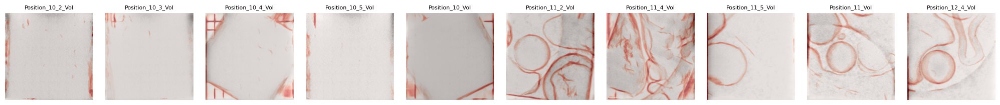

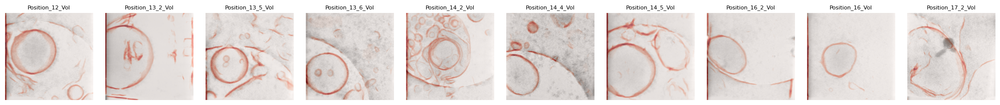

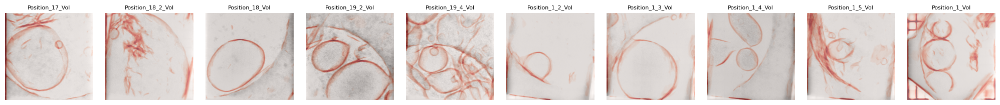

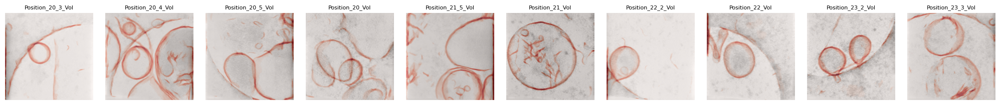

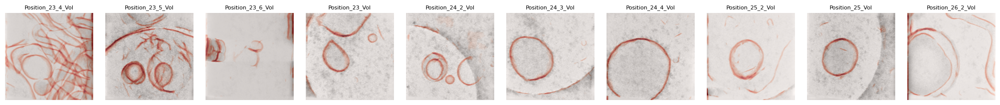

...

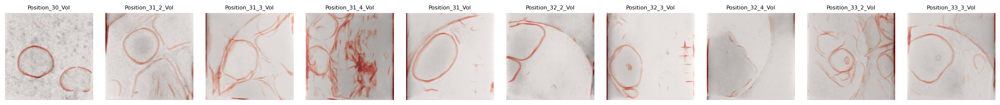

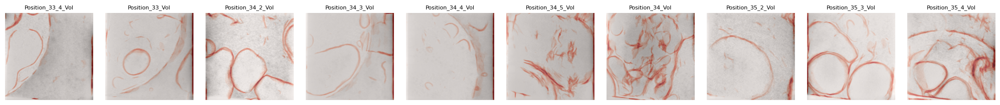

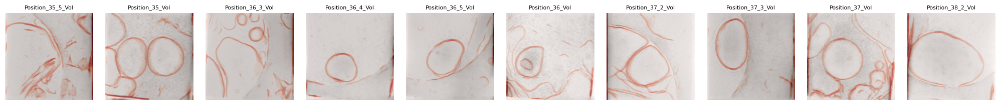

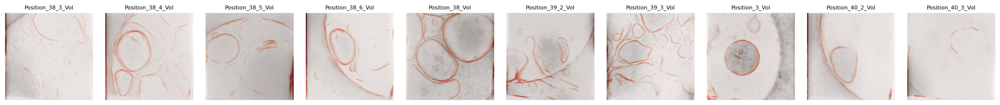

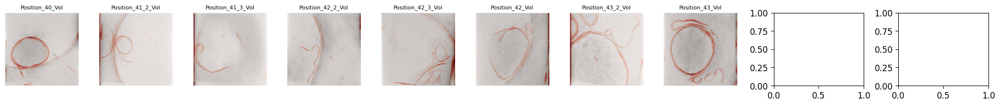

In [15]:
fig = None
fig_col_count = 0
no_organelles = []
for run in no_organelles_all:
    tomo = utils.get_tomogram(run, verbose=False)
    membrane = utils.get_membrane(run, verbose=False)

    if fig is None:
        fig, axs = plt.subplots(1, 10, figsize=(20, 2), constrained_layout=True)
        axs = axs.ravel()
    axs[fig_col_count].imshow(tomo.sum(axis=0), cmap="gray")
    axs[fig_col_count].imshow(membrane.sum(axis=0), cmap="Reds", alpha=0.5)
    axs[fig_col_count].set_title(run.name, fontsize=8)
    axs[fig_col_count].axis("off")
    fig_col_count += 1
    if fig_col_count == 10:
        fig_col_count = 0
        plt.show()
        fig = None
    # raise


### This is for cryosam2_1 results

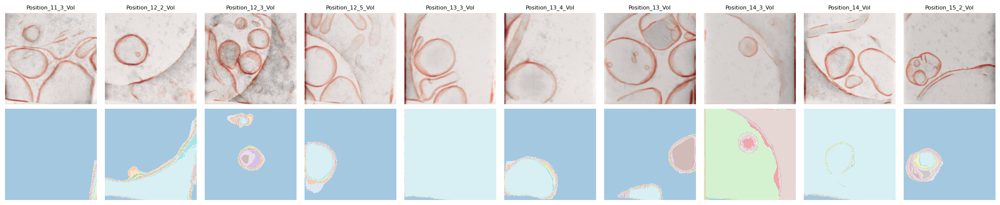

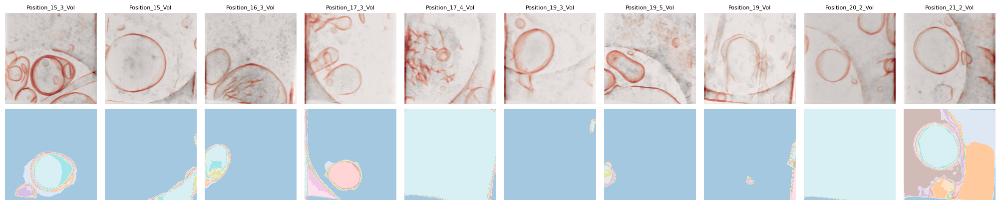

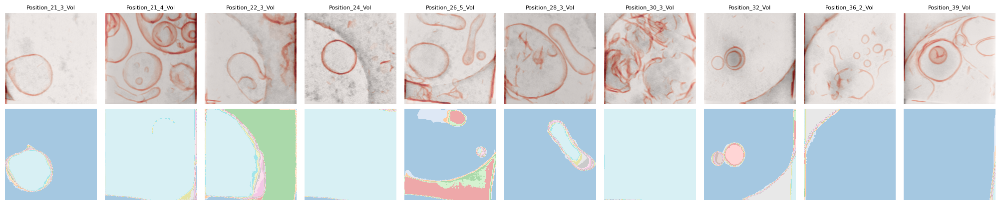

IndexError: list index out of range

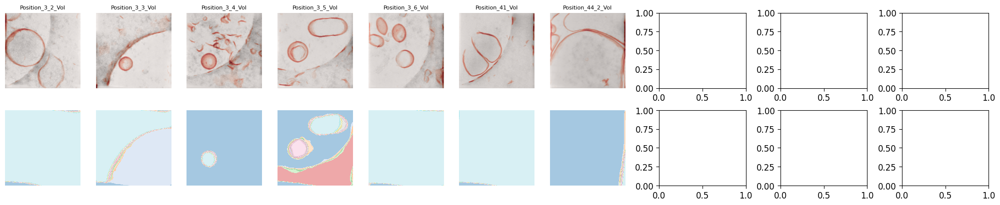

In [64]:
cryosam_index = 1

fig = None
fig_col_count = 0
verbose = False

organelle_segs_all = []
no_organelles_all = []
no_cryosam = []
for run in memb_runs:
    organelle_segs = run.get_segmentations("cryoSAM2")
    if len(organelle_segs) == 0:
        if verbose:
            print(f"Skipping {run.name} as it has no cyoSAM outputs")
        no_cryosam.append(run)
        continue
    elif organelle_segs[cryosam_index].numpy().max() == 0:
        if verbose:
            print(f"Skipping {run.name} as it has no organelle segmentation")
        no_organelles_all.append(run)
        continue
    tomo = utils.get_tomogram(run, verbose=False)
    membrane = utils.get_membrane(run, verbose=False)

    if fig is None:
        fig, axs = plt.subplots(2, 10, figsize=(20, 4), constrained_layout=True)
        axs = axs.ravel()
    axs[fig_col_count].imshow(tomo.sum(axis=0), cmap="gray")
    axs[fig_col_count].imshow(membrane.sum(axis=0), cmap="Reds", alpha=0.5)
    axs[fig_col_count].set_title(run.name, fontsize=8)
    axs[fig_col_count].axis("off")

    if len(organelle_segs) == 0:
        axs[fig_col_count + 10].set_title("No_org_seg", fontsize=8)
    else:
        cm = axs[fig_col_count + 10].imshow(
            organelle_segs[cryosam_index].numpy().sum(axis=0), cmap="tab20", alpha=0.4
        )
        axs[fig_col_count + 10].axis("off")
        # axs[fig_col_count + 10].set_title("No_org_seg", fontsize=8)
        # plt.colorbar(cm, ax=axs[fig_col_count + 10], fraction=0.046, pad=0.04)
    fig_col_count += 1
    if fig_col_count == 10:
        fig_col_count = 0
        plt.show()
        fig = None
    organelle_segs_all.append(run)
    # raise
